# [IAPR][iapr]: Lab 1 ‒  Image segmentation


**Group ID:** 28

**Author 1 (sciper):** Antonovitch Nils (310410)  
**Author 2 (sciper):** Dinev Konstantin (314419)   
**Author 3 (sciper):** Muller Nathan (311991)  

**Release date:** 08.03.2024  
**Due date:** 22.03.2024 (11:59 pm)


## Important notes

The lab assignments are designed to teach practical implementation of the topics presented during class as well as preparation for the final project, which is a practical project that ties together the topics of the course.

As such, in the lab assignments/final project, unless otherwise specified, you may, if you choose, use external
functions from image processing/ML libraries like OpenCV and sklearn as long as there is sufficient explanation
in the lab report. For example, you do not need to implement your own edge detector, etc.

**! Before handling back the notebook <font color='red'> rerun </font>the notebook from scratch !**
`Kernel` > `Restart & Run All`

TAs should be able to rerun your code end to end without having any issues. If not, you might lose part of the points during grading.

[iapr]: https://github.com/LTS5/iapr

In [1]:
%pip install numpy
%pip install matplotlib
%pip install scikit-image
%pip install pillow
%pip install matplotlib
%pip install opencv-python


Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
# Check is at least python 3.9
import sys 
print(sys.version_info)
assert (sys.version_info.major == 3) and (sys.version_info.minor >= 9)

sys.version_info(major=3, minor=9, micro=18, releaselevel='final', serial=0)


In [3]:
# Import main packages
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
from PIL import Image
from typing import Callable
import cv2
import os
from datetime import datetime

---
# Introduction


In this lab, we will be working with histological data. Histological images are created from tissue samples that are digitized using high-resolution scanners. Without preparation, human tissues lack visual contrast and have poor tissue differentations. To overcome this issue, clinical institutes use chemical staining to artificially enhance contrast. The most famous one is called HE (hematoxylin and eosin) staining. Hematoxylin stains tissue nuclei with a deep purple while eosin focuses more on extracellular matrix components with a pink stain.

Before running the following code make sure that the images are located as follows:

```code
├── labs
│   └── lab_01_iapr.ipynb
└── data
    └── data_lab_01
        ├── tcga_crc_example.png
        └── tcga_blood_example.png
```

By running the following cells you will display a HE histological sample of a colorectal cancer case. It is composed of 3 main entities:
* **Mucin**: Grayish mucus that is secreted by the body. The presence of a tumor tends to increase its presence. 
* **Tumor**: Dark purple aggregates (hematoxylin). Mainly composed of cancerous cells.
* **Other**: Mixture of other cells such as stromal or lymphocytes. It appears mainly pink (eosin) but is dotted with nuclei (purple).

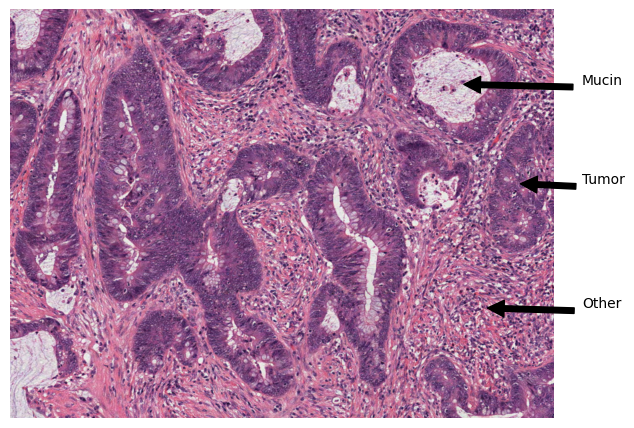

In [4]:
# Define path
path_he = os.path.join("..", "data", "data_lab_01", "tcga_crc_example.png")
# Check if folder and image exist
assert os.path.exists(path_he), "Image not found, please check directory structure"

# Load image
img_he = np.array(Image.open(path_he))

# Display image
plt.imshow(img_he)
plt.axis('off')

# Annotations
plt.annotate('Mucin', xy=(900, 150), xytext=(1150, 150), arrowprops=dict(facecolor='black', shrink=0.05))
plt.annotate('Tumor', xy=(1020, 350), xytext=(1150, 350), arrowprops=dict(facecolor='black', shrink=0.05))
plt.annotate('Other', xy=(950, 600), xytext=(1150, 600), arrowprops=dict(facecolor='black', shrink=0.05))
plt.tight_layout()


# Part 1 - Segmentation

## Part 1.1 - RBG (3 pts)

**Q1 (1 pts)**: In this section, you will have to complete the function `extract_rgb_channels`. The function should extract and return red, blue, and green channels from the input image `img`. Your function will be fed to `plot_colors` to plot the distribution of the colors in the image. 

In [5]:
def extract_rgb_channels(img):
    """
    Extract RGB channels from the input image.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.
    
    Return
    ------
    data_red: np.ndarray (M, N)
        Red channel of input image
    data_green: np.ndarray (M, N)
        Green channel of input image
    data_blue: np.ndarray (M, N)
        Blue channel of input image
    """

    # Get the shape of the input image
    M, N, C = np.shape(img)
    print(f"Image shape: {M}x{N}x{C}")

    # Define default values for RGB channels
    data_red = np.zeros((M, N))
    data_green = np.zeros((M, N))
    data_blue = np.zeros((M, N))

    # ------------------
    data_red = img[:, :, 0]
    data_green = img[:, :, 1]
    data_blue = img[:, :, 2]
    # ------------------
    
    return data_red, data_green, data_blue

Image shape: 822x1094x3


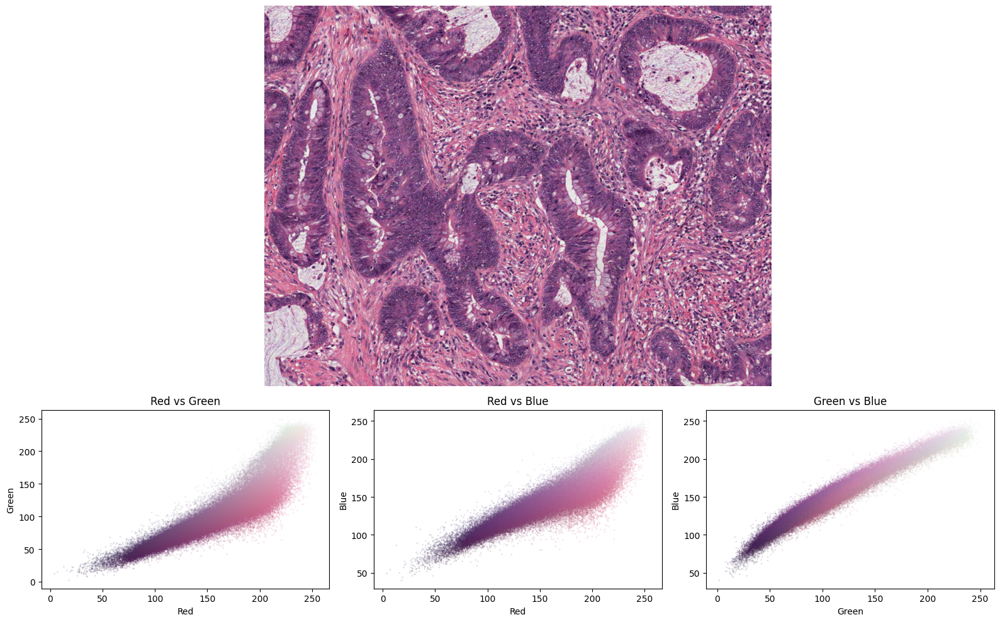

In [6]:
# Plot color space distribution 
def plot_colors_histo(
    img: np.ndarray,
    func: Callable,
    labels: list[str],
):
    """
    Plot the original image (top) as well as the channel's color distributions (bottom).

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.
    func: Callable
        A callable function that extracts D channels from the input image
    labels: list of str
        List of D labels indicating the name of the channel
    """

    # Extract colors
    channels = func(img=img)
    C2 = len(channels)
    M, N, C1 = img.shape
    fig = plt.figure(figsize=(16, 10))
    gs = fig.add_gridspec(3, C2)

    # Use random seed to downsample image colors (increase run speed - 10%)
    mask = np.random.RandomState(seed=0).rand(M, N) < 0.1
    
    # Plot base image
    ax = fig.add_subplot(gs[:2, :])
    ax.imshow(img)
    # Remove axis
    ax.axis('off')
    ax1 = fig.add_subplot(gs[2, 0])
    ax2 = fig.add_subplot(gs[2, 1])
    ax3 = fig.add_subplot(gs[2, 2])

    # Plot channel distributions
    ax1.scatter(channels[0][mask].flatten(), channels[1][mask].flatten(), c=img[mask]/255, s=1, alpha=0.1)
    ax1.set_xlabel(labels[0])
    ax1.set_ylabel(labels[1])
    ax1.set_title("{} vs {}".format(labels[0], labels[1]))
    ax2.scatter(channels[0][mask].flatten(), channels[2][mask].flatten(), c=img[mask]/255, s=1, alpha=0.1)
    ax2.set_xlabel(labels[0])
    ax2.set_ylabel(labels[2])
    ax2.set_title("{} vs {}".format(labels[0], labels[2]))
    ax3.scatter(channels[1][mask].flatten(), channels[2][mask].flatten(), c=img[mask]/255, s=1, alpha=0.1)
    ax3.set_xlabel(labels[1])
    ax3.set_ylabel(labels[2])
    ax3.set_title("{} vs {}".format(labels[1], labels[2]))
        
    plt.tight_layout()

# Call plotting function with your implemented function
plot_colors_histo(
    img = img_he,
    func = extract_rgb_channels,
    labels = ["Red", "Green", "Blue"],
)

Based on the result of the plot above

* **Q2 (1 pts)**: Do you think you can find a simple manual thresholding approach to isolate the tumor components? 

* **Answer**: We can clearly see that the tumor has a darker violet color compared to the other components in the image. Inside some of the tumors, there is a white color. Using the scatter plots from above, we can clearly see that with simple thresholding after 130 in the Red, Blue, and Green axes, we can only keep this darker violet color and thus separate it into two groups. However, in this approach, we assume that all tumors have similar color and intensity which in real scenario wouldn't always be the case.

* **Q3 (1 pts)**: Implement your own manual thresholding in `apply_rgb_threshold` to estimate the tumor location. Use the function `plot_thresholded_image` below to display your estimation results. Do you think your estimation is reliable? 
    * **Answer**: The assumption made in the previous question is correct as we are able to isolate the tumors from the mucin. Despite this, the estimation is not reliable as there are other elements that have a very dark color and are therefore taken into account when applying the simple thresholding. We tried using a double thresholding to keep all the elements with values between 50 and 130 and the results where better but the estimation is not quite perfectly reliable. One way to give better results could be to apply a denoising filter __(for example here, a high pass filter to get rid of the darker spots in the "other" region)__ to the image to get rid of the noise created by the other elements.

In [7]:
def apply_rgb_threshold(img):
    """
    Apply threshold to RGB input image.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.
    
    Return
    ------
    img_th: np.ndarray (M, N)
        Thresholded image.
    """

    # Define the default value for the input image
    M, N, C = np.shape(img)
    img_th = np.zeros((M, N))

    # Use the previous function to extract RGB channels
    data_red, data_green, data_blue = extract_rgb_channels(img=img)
    
    # Define threshold values for each color channel
    threshold_redL = 50
    threshold_greenL = 50
    threshold_blueL = 50
    threshold_redH = 130
    threshold_greenH = 130
    threshold_blueH = 130

    # Apply the threshold to each color channel
    img_th[(data_red > threshold_redL) & (data_red < threshold_redH) & 
           (data_green > threshold_greenL) & (data_green < threshold_greenH) & 
           (data_blue > threshold_blueL) & (data_blue < threshold_blueH)] = 1

    return  img_th

Image shape: 822x1094x3


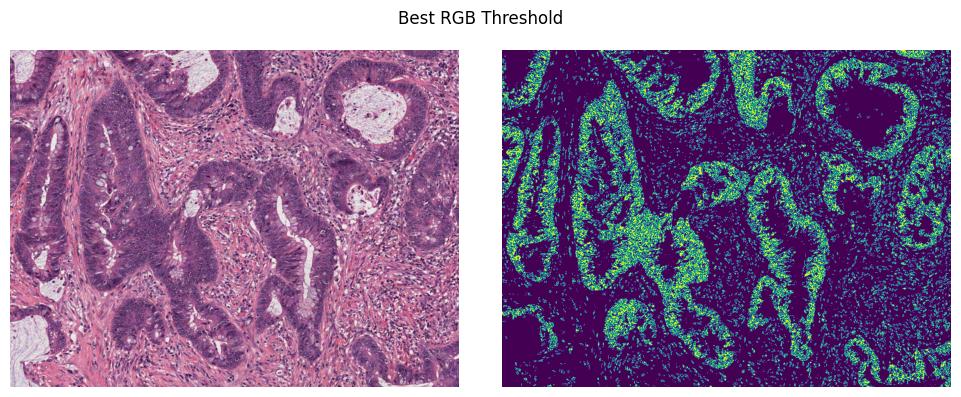

In [8]:
# Plot color space distribution 
def plot_thresholded_image(
    img: np.ndarray,
    func: Callable,
    title: str,
):
    """
    Plot the original image and its thresholded version

    Args
    ----
    img: np.ndarray (M, N, 3)
        Input image of shape MxNx3.
    func: Callable
        Thresholded image.
    title: str
        Title of the plot
    """

    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    axes[0].imshow(img)
    axes[1].imshow(func(img))
    [a.axis('off') for a in axes]
    plt.suptitle(title)
    plt.tight_layout()
    
# Plot best RGB thresholding
plot_thresholded_image(img=img_he, func=apply_rgb_threshold, title="Best RGB Threshold")

## Part 1.2 - Other colorspaces (3 pts)

So far we used the standard RGB colorspace to apply our thresholding. In this section, you will convert the image to a different color space. 

* **Q1 (1 pts)**: Use de function `rgb2hsv` from the skimage package ([see doc](https://scikit-image.org/docs/stable/auto_examples/color_exposure/plot_rgb_to_hsv.html)) to convert the input image from RGB to HSV in function `extract_hsv_channels`.
* **Q2 (1 pts)**: Can you see any difference between the use of the RGB or HSV space? (justify)
    * **Answer**: A difference between RGB and HSV is the fact that for RGB we add some linear relationship between the different RGB channels while for HSV, it is not the case anymore. As seen in class HSV is a more intuitive representation of color based on human perception of the brightness (value) and intensity (saturation) and dominant color (hue).

In [9]:
from skimage.color import rgb2hsv
def extract_hsv_channels(img):
    """
    Extract HSV channels from the input image.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.
    
    Return
    ------
    data_h: np.ndarray (M, N)
        Hue channel of input image
    data_s: np.ndarray (M, N)
        Saturation channel of input image
    data_v: np.ndarray (M, N)
        Value channel of input image
    """

    # Get the shape of the input image
    M, N, C = np.shape(img)

    # Define default values for HSV channels
    data_h = np.zeros((M, N))
    data_s = np.zeros((M, N))
    data_v = np.zeros((M, N))

    # ------------------
    hsv_img = rgb2hsv(img)

    data_h = hsv_img[:, :, 0]
    data_s = hsv_img[:, :, 1]
    data_v = hsv_img[:, :, 2]
    # ------------------
    
    return data_h, data_s, data_v

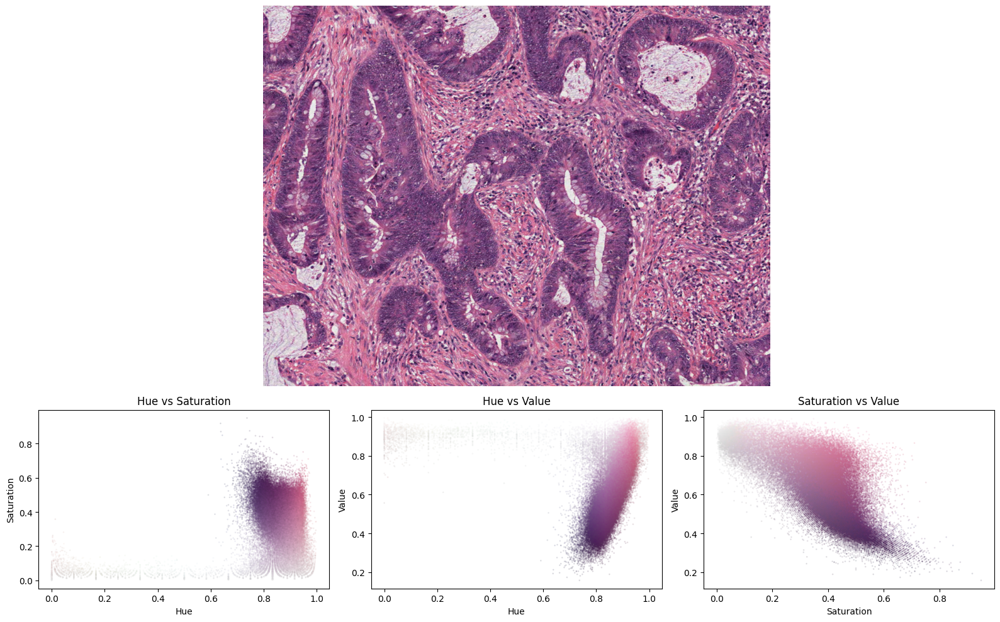

In [10]:
# Call plotting function with your implemented function
plot_colors_histo(
    img = img_he,
    func = extract_hsv_channels,
    labels = ["Hue", "Saturation", "Value"],
)

* **Q3 (1 pts)**: Based on your results, try again to find the best manual threshold in function `apply_hsv_threshold`. Do you think your estimation is reliable? (justify)
    * **Answer**: We observe a noticeable enhancement in the outcome obtained through our thresholding compared to the results achieved with RGB values. As demonstrated in class, a significant portion of image processing and analysis involves the utilization of HSV images. Nevertheless, since our approach relies on straightforward thresholding with predetermined high and low values, it may not consistently detect tumors accurately under real-world conditions where tumors can vary in size, intensity, and brightness

In [11]:
def apply_hsv_threshold(img):
    """
    Apply threshold to the input image in hsv colorspace.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.
    
    Return
    ------
    img_th: np.ndarray (M, N)
        Thresholded image.
    """

    # Define the default value for the input image
    M, N, C = np.shape(img)
    img_th = np.zeros((M, N))

    # Use the previous function to extract HSV channels
    data_h, data_s, data_v = extract_hsv_channels(img=img)
    
    # ------------------
    # Define threshold values for each color channel
    threshold_hueL = 0.05
    threshold_valueL = 0.06
    threshold_satL = 0.04
    threshold_hueH = 0.97
    threshold_valueH = 0.60
    threshold_satH = 0.62

    # Apply the threshold to each color channel
    img_th[(data_h > threshold_hueL) & (data_h < threshold_hueH) & 
           (data_s > threshold_satL) & (data_s < threshold_satH) & 
           (data_v > threshold_valueL) & (data_v < threshold_valueH)] = 1
     
    # ------------------
    
    # Convert image to boolean type
    img_th = img_th.astype(bool)

    return  img_th

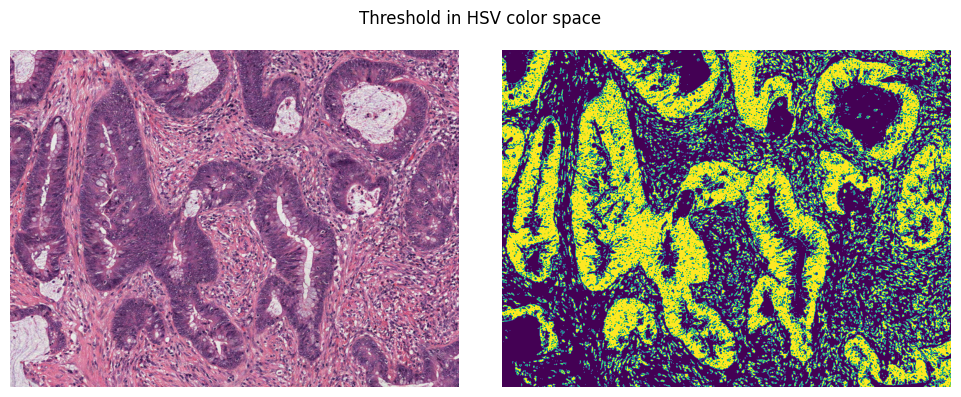

In [12]:
# Find threshold(s) in the hsv channels
plot_thresholded_image(img=img_he, func=apply_hsv_threshold, title="Threshold in HSV color space")

## Part 1.3 - Morphology (5 pts)

To proceed, we will use your results from the previous thresholding (namely `apply_hsv_threshold`) as the starting point. In this exercise, we will try to clean the masked images using morphology to get a better estimation of the tumor area.

* **Q1 (1 pts)** Implement the functions `apply_closing` and `apply_opening` with operations `closing` ([see doc](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.closing)), `opening` ([see doc](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.opening)) using the disk sizes arguments ([see doc](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.disk)).
* **Q2 (1 pts)** We test disk sizes: $1, 2, 5, 10$. Comment on the quality of the results.
    * **Answer**: Our thresholding suffers from two problems: the first one is that we get false positives, especially in the "other" region, the second is that we get false negatives in the "tumor" regions. By looking at our results, we can see that by closing, we diminish the number of false negatives, and by opening, we diminish the number of false positives. For closing, disk size values above 2 lead to too many cells being identified as cancerous. This is due to the important amount of false positives in the original post-threshold data. For opening, disk size values equal or greater than 2 get rid of too many cancerous cells. This is due to too many cancerous cells not being labeled as such (false negatives) in the original post-threshold data. So, for closing, the best value is 2 and for opening: it is 1.

In [13]:
from skimage.morphology import disk , closing, opening 

def apply_closing(img_th, disk_size):
    """
    Apply closing to input mask image using disk shape.

    Args
    ----
    img_th: np.ndarray (M, N)
        Image mask of size MxN.
    disk_size: int
        Size of the disk to use for closing

    Return
    ------
    img_closing: np.ndarray (M, N)
        Image after closing operation
    """

    # Define default value for output image
    img_closing = np.zeros_like(img_th)

    # Apply closing operation
    img_closing = closing(img_th, footprint=disk(disk_size))

    return img_closing


def apply_opening(img_th, disk_size):
    """
    Apply opening to input mask image using disk shape.

    Args
    ----
    img_th: np.ndarray (M, N)
        Image mask of size MxN.
    disk_size: int
        Size of the disk to use for opening

    Return
    ------
    img_opening: np.ndarray (M, N)
        Image after opening operation
    """

    # Define default value for output image
    img_opening = np.zeros_like(img_th)
    
    # Apply opening operation
    img_opening = opening(img_th, footprint=disk(disk_size))

    return img_opening

In [14]:
def plot_images(
    imgs: np.ndarray,
    sizes: list[int],
    title: str,
):
    """
    Plot multiple images. The title of each subplot is defined by the disk_size elements.

    Args
    ----
    imgs: np.ndarray (D, M, N)
        List of D images of size MxN.
    disk_sizes: list of int
        List of D int that are the size of the disk used for the operation
    title:
        The overall title of the figure
    """
    D = len(imgs)
    ncols = int(np.ceil(D/2))
    fig, axes = plt.subplots(nrows=2, ncols=ncols, figsize=(10, 4*ncols))
    
    # Remove axis
    axes = axes.ravel()
    [ax.axis('off') for ax in axes]
    
    for i in range(D):
        axes[i].imshow(imgs[i])
        axes[i].set_title("Size: {}".format(sizes[i]))
    
    plt.suptitle(title)
    plt.tight_layout()       

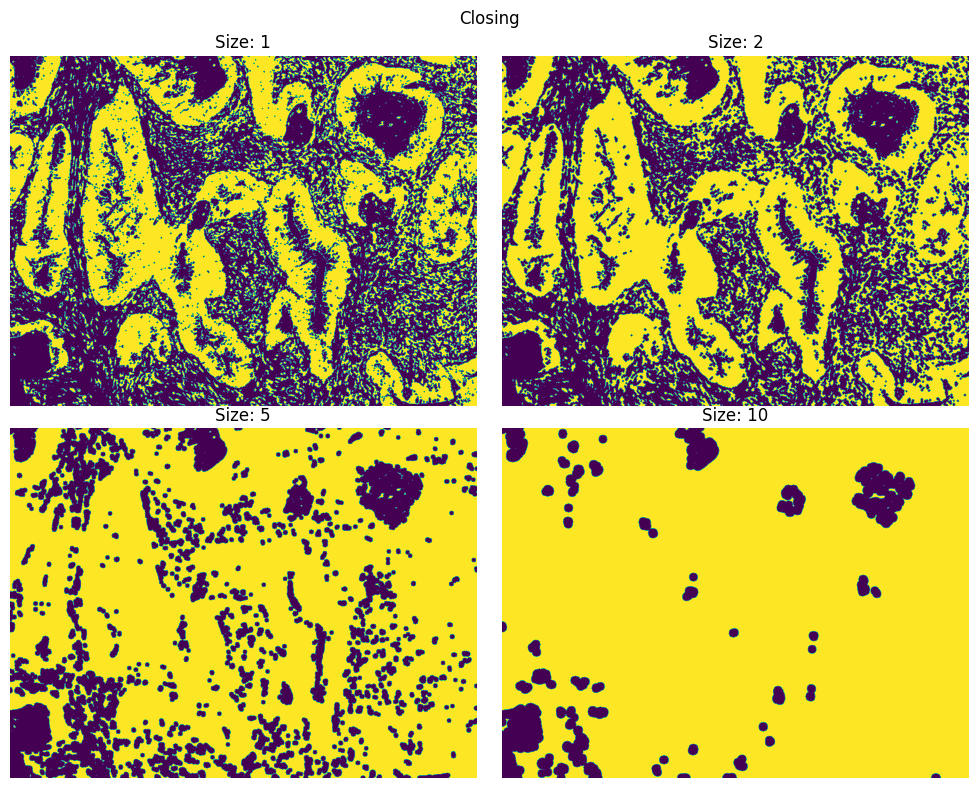

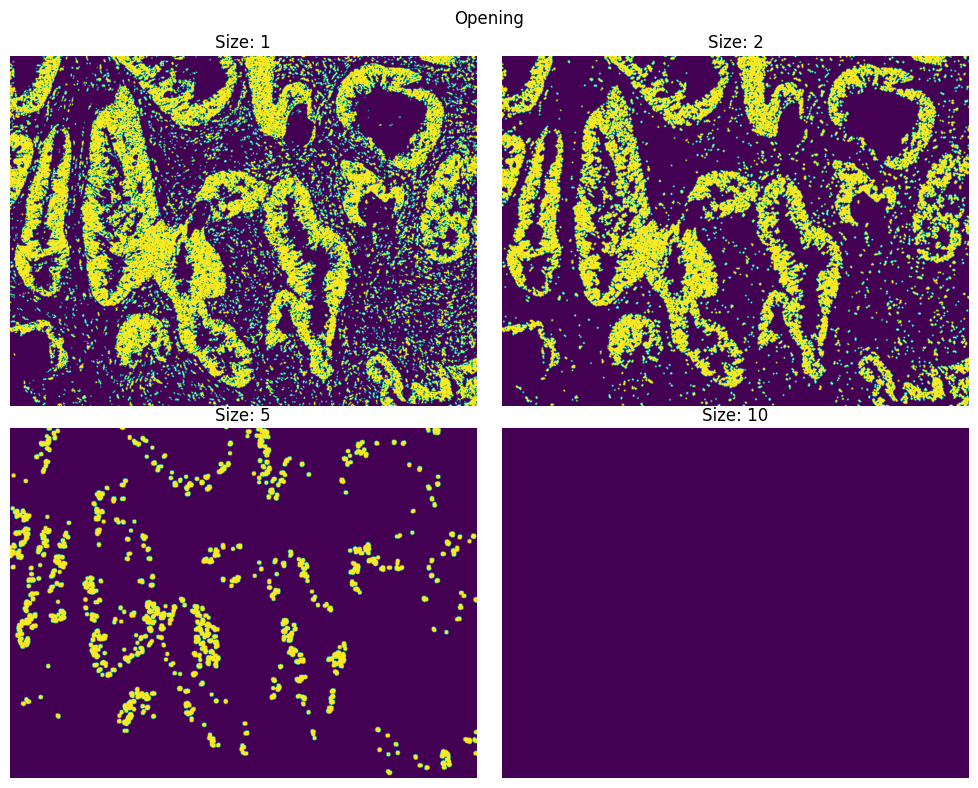

In [15]:
# Define disk sizes
disk_sizes = [1, 2, 5, 10]
imgs_closing = []
imgs_opening = []
# Apply threhsold in HSV space
img_th = apply_hsv_threshold(img_he)

# Apply opening and closing to masked image 
for d in disk_sizes:
    imgs_closing.append(apply_closing(img_th, d))
    imgs_opening.append(apply_opening(img_th, d))
    
# Plot results
plot_images(imgs=imgs_closing, sizes=disk_sizes, title="Closing")
plot_images(imgs=imgs_opening, sizes=disk_sizes, title="Opening")

* **Q3 (1 pts)** Implement the functions `remove_holes` and `remove_objects` using operations [remove_small_holes](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_holes), [remove_small_objects](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_objects) from skimage package, respectively.
* **Q4 (1 pts)** We test the functions using area sizes: $10, 50, 100$, and $500$. Comment on the quality of the results.
    * **Answer**: The removal of small holes allows to connect discontinuous regions of the same tumor. The removal of small objects gets rid of false positives in the "other" region. For the removal of small holes, the results are better than the ones obtained by closing the image, since they do not connect the cancerous regions with cells in the "other" region. The best results are obtained with a value of 500. For the removal of small objects, the results are also better than the ones obtained via opening, because even with a small area size, all of the false positives are removed, while losing less of the true positives. Here, the contours of the tumors are clearly visible. The best results are obtained with an area size of 50.

In [16]:
from skimage.morphology import remove_small_holes, remove_small_objects

def remove_holes(img_th, size):
    """
    Remove holes from input image that are smaller than size argument.

    Args
    ----
    img_th: np.ndarray (M, N)
        Image mask of size MxN.
    size: int
        Minimal size of holes

    Return
    ------
    img_holes: np.ndarray (M, N)
        Image after remove holes operation
    """

    # Define default value for input image
    img_holes = np.zeros_like(img_th)

    # Remove small holes
    img_holes = remove_small_holes(img_th, area_threshold=size)

    return img_holes


def remove_objects(img_th, size):
    """
    Remove objects from input image that are smaller than size argument.

    Args
    ----
    img_th: np.ndarray (M, N)
        Image mask of size MxN.
    size: int
        Minimal size of objects

    Return
    ------
    img_obj: np.ndarray (M, N)
        Image after remove small objects operation
    """
     # Define default value for input image
    img_obj = np.zeros_like(img_th)

    # Remove small objects
    img_obj = remove_small_objects(img_th, min_size=size)

    return img_obj

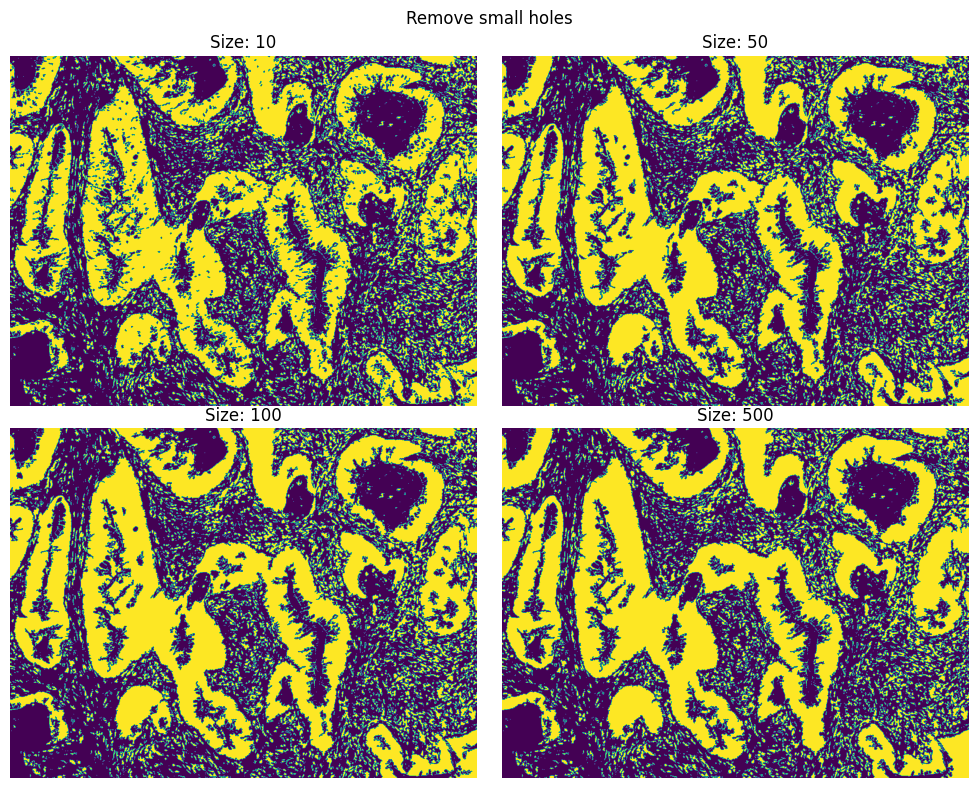

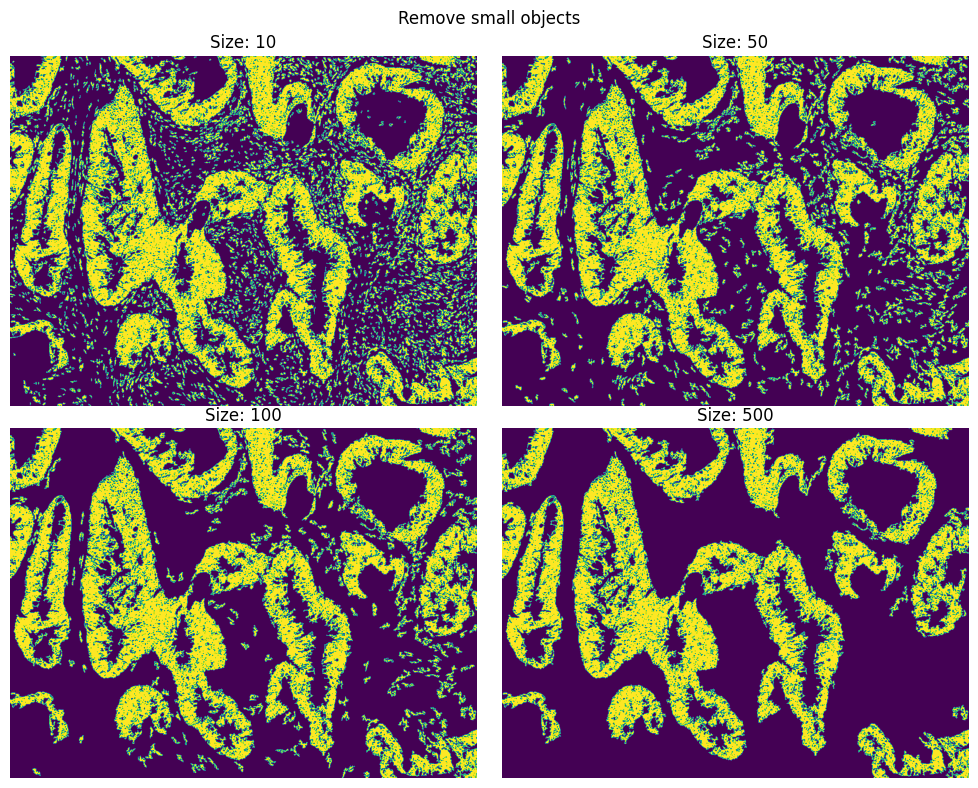

In [17]:
# Define area sizes
sizes = [10, 50, 100, 500]
imgs_holes = []
imgs_objects = []
# Apply threhsold in HSV space
img_th = apply_hsv_threshold(img_he)

# Remove holes and objects from masked image 
for d in sizes:
    imgs_holes.append(remove_holes(img_th, d))
    imgs_objects.append(remove_objects(img_th, d))
    
# Plot results    
plot_images(imgs=imgs_holes, sizes=sizes, title="Remove small holes")
plot_images(imgs=imgs_objects, sizes=sizes, title="Remove small objects")

* **Q5 (1 pts)** Based on your previous results, implement the function `apply_morphology` that combines morphology functions to improve your tumor detection results from HSV thresholding.

In [45]:
def apply_morphology(img_th):
    """
    Apply morphology to thresholded image

    Args
    ----
    img_th: np.ndarray (M, N)
        Image mask of size MxN.

    Return
    ------
    img_morph: np.ndarray (M, N)
        Image after morphological operations
    """

    img_morph = np.zeros_like(img_th)
    
    # ------------------
    size = 500
    d = 600

    # Remove small objects
    img_morph = remove_objects(img_th, size)
    
    # Remove small holes
    img_morph = remove_holes(img_morph, d)

    # ------------------
    return img_morph

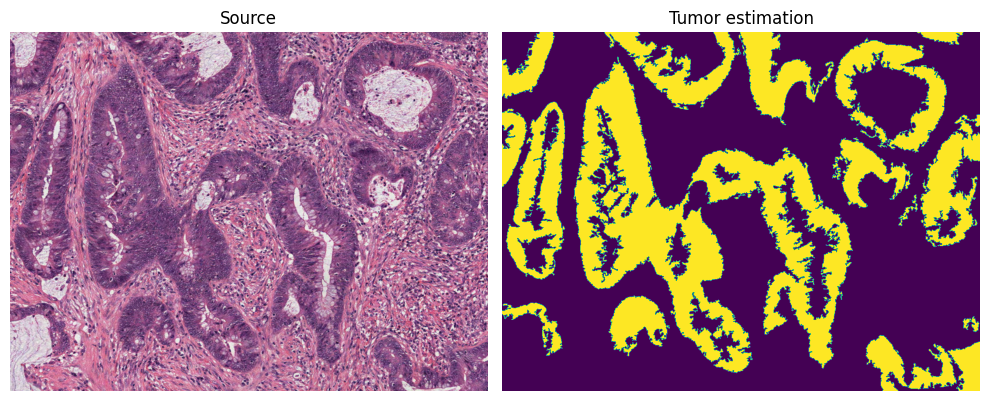

In [46]:
def plot_morphology_best(
    img_source: np.ndarray,
    img_best: np.ndarray,
):
    """
    Plot the original images beside the best tumor estimation

    Args
    ----
    img_source: np.ndarray (M, N, 3)
        RGB source image.
    img_best: np.ndarray (M, N)
        Best thresholded image.
    """
    
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))
    
    # Remove axis
    axes = axes.ravel()
    [ax.axis('off') for ax in axes]
    axes[0].imshow(img_source)
    axes[1].imshow(img_best)
    axes[0].set_title("Source")
    axes[1].set_title("Tumor estimation")
    
    plt.tight_layout() 

plot_morphology_best(
    img_source=img_he,
    img_best=apply_morphology(apply_hsv_threshold(img_he)),
)

## Part 1.4 - Region Growing (4 pts)

* **Q1 (3 pts)** In this section we ask you to implement from scratch your own `region_growing` function to detect the tumor area. The function should take as input an RGB image, seeds that are manual initialization points in the tumor area, and the maximum number of iterations to perform. Note that the function also includes the kwargs argument. You can use it to add additional parameters to your function if needed (see [doc kwargs](https://book.pythontips.com/en/latest/args_and_kwargs.html))
* **Q2 (1 pts)** Your function is then used to perform region growing using multiple iterations. Comment on the quality of the results based on the number of iterations performed as well as the running time.
    * **Answer**: The results heavily depend on the number of iterations. After only 100 iterations, the regions do not have the time to grow to their potential maximum size. After 1000 iterations, the results do not change anymore: all the pixels that would possibly be included in a region have been included. The running time is quite fast, but not proportional to the number of iterations: it increases faster that the number of iterations. The more the number of iterations approaches the value where no more pixels join a region, the better the result. However, this takes more time. Overall, after 1000 iterations, our results are quite good: the tumor regions are well defined and we do not have a lot of false positives.
* **Remark**: We are aware that using an iterative solution does not allow to go to a depth similar to a recursive approach. However, a recursive approach uses a lot of memory, and with our implementation of the iterative solution, the result does not change after 1000 iterations. Indeed, if we try with 1500 iterations, the areas detected as tumors stay the same.

In [47]:
def region_growing(
    seeds: list[tuple],
    img: np.ndarray,
    n_max: int = 10,
    **kwargs,
):
    """
    Run region growing on input image using seed points.

    Args
    ----
    seeds: list of tuple
        List of seed points
    img: np.ndarray (M, N, C)
        RGB image of size M, N, C
    n_max: int
        Number maximum of iterations before stopping algorithm
    kwargs: 
        Additional arguments if you need (ex: variance max, channel to use, etc...)

    Return
    ------
    rg: np.ndarray (M, N)
        Image after region growing has been performed
    """
    
    M, N, C = img.shape
    rg = np.zeros((M, N)).astype(bool)
    
    # ------------------
    # Convert image to grayscale
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) 

    # We create a list of pixels to grow next iteration
    to_grow = np.zeros((M, N)).astype(bool)
    
    # We define thresholds
    value_threshold = 140
    var_threshold = 230
    
    # Since the seeds are manually selected, we assure that they are correclty placed in the tumor area
    for seed in seeds:
        rg[seed] = True
        
    for iteration in range(n_max):
         # Get the coordinaes of the pixels to grow
        if (iteration == 1):
            # In the first iteration, only the seeds need to grow
            pixels_to_grow_coords = np.transpose(np.where(rg == True))
        else:
            pixels_to_grow_coords = np.transpose(np.where(to_grow == True))
        # Check pixel's neighbors
        for pixel in pixels_to_grow_coords:
            
            for dx, dy in [(-1, 0), (1, 0), (0, -1), (0, 1), (-1, -1), (-1, 1), (1, -1), (1, 1)]:
                x, y = pixel[0] + dx, pixel[1] + dy
                
                # Check if coordinates are valid and pixel is not yet in the region
                if x >= 0 and x < M and y >= 0 and y < N and not rg[x, y]:
                    # Calculate local variance around the pixel
                    local_var = np.var(img_gray[max(0, x-1):min(M, x+2), max(0, y-1):min(N, y+2)])
                    # Check if local variance and intensity difference are below their respective thresholds
                    if local_var <= var_threshold and img_gray[x, y] <= value_threshold:
                        # Add pixel to region
                        rg[x, y] = True
                        # Add pixel as a pixel to grow next iteration
                        to_grow[x, y] = True
                # Remove the pixel from the list of pixels to grow
            to_grow[pixel[0], pixel[1]] = False
    return rg

In [48]:
def plot_region_growing(
    seeds: list[tuple],
    img: np.ndarray,
    func: Callable,
    iters: list[int],
):
    """
    Plot the region growing results based on seeds, function and iterations
    
    Args
    ----
    seeds: list of tuple
        List of seed points
    img: np.ndarray (M, N, C)
        RGB image of size M, N, C
    func: callable
        Region growing function
    iters: list of ints
        Number of iteration to plot
    """

    # Define plot size
    n = len(iters) + 1
    n_rows = np.ceil(n // 2).astype(int)
    _, axes = plt.subplots(n_rows, 2, figsize=(16, 6*n_rows))
    axes = axes.ravel()
    [a.axis('off') for a in axes]   

    # Reference image
    axes[0].imshow(img)
    axes[0].set_title("Input image")

    # Plot all iterations
    for i, it in enumerate(iters):
        t1 = datetime.now()
        img_rg = region_growing(seeds=seeds, img=img, n_max=iters[i])
        # Compute time difference in seconds
        t2 = datetime.now()
        seconds = (t2 - t1).total_seconds()
        axes[i+1].imshow(img_rg, interpolation="nearest")
        axes[i+1].set_title("RG {} iter in {:.2f} seconds".format(iters[i], seconds))
                            
    plt.tight_layout()

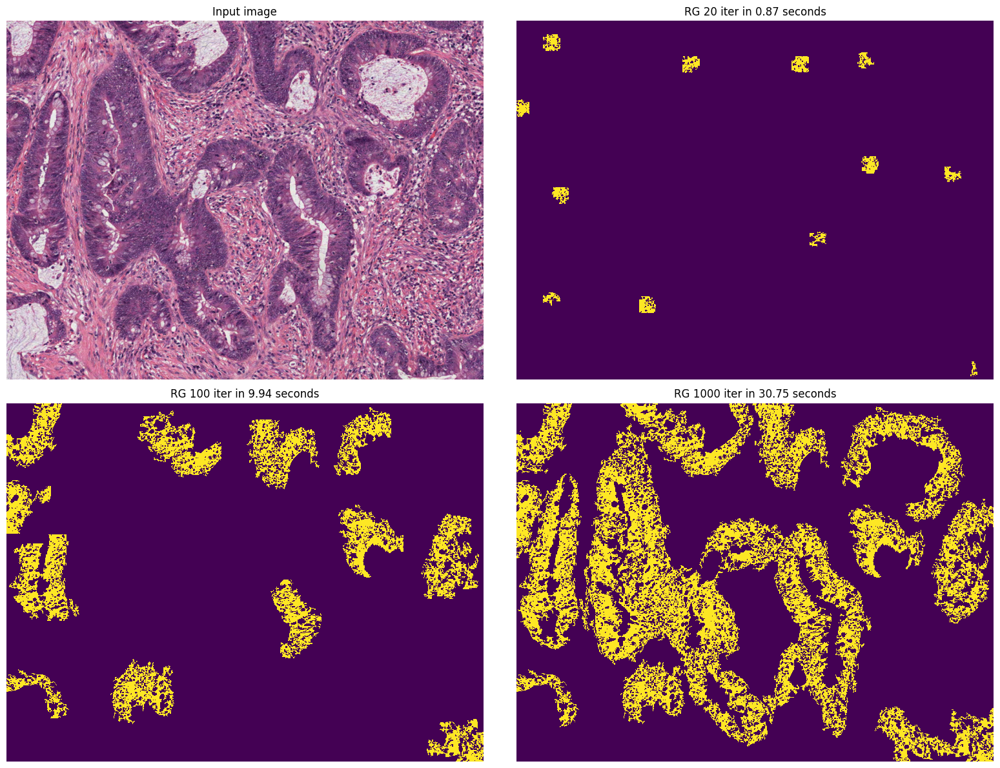

In [49]:
# Set manual seeds (located inside tumor blobs)
seeds = [
    (50, 80), (450, 300), (400, 100), (200, 10), (640, 80), 
    (650, 300), (100, 400), (100, 650), (90, 800), (330, 810), 
    (350, 1000), (500, 690),  (800, 1050), 
]

plot_region_growing(
    seeds=seeds,
    img=img_he,
    func=region_growing,
    iters=[20, 100, 1000],
)

In [50]:
M, N, C = img_he.shape
print(f"Image shape: {M}x{N}x{C}")

Image shape: 822x1094x3


## Part 1.5 - Final Comparison (1 pts)

* **Q1 (1 pts)** Run the cell below. Based on your observation, which approach do you think gives the best estimation of the tumor area? (justify)
    * **Answer**: Ideally, we would like an approach that allows us to get the least possible amount of false positives and false negatives. Therefore, the HSV threshold method is not the best suited one, because it classifies a lot lof cells in the "other" region as tumors. The second best choise would be the HSV threshold+morphology. Indeed, we have almost no false positives here. However, the outlines of the detected tumor regions do match the shape of the actual tumor region very well. Also, some parts of the regions are not detected as such: we get false negatives. The best choice is the region growing: we get only a small amount of false positives, all the regions are detected. The only downside is that there are a lot of small holes in the detected region, it would be interesting to try to run a closing algorithm on the result of the region growind with a disk that has a small radius to close these small holes, but not the mucin regions.

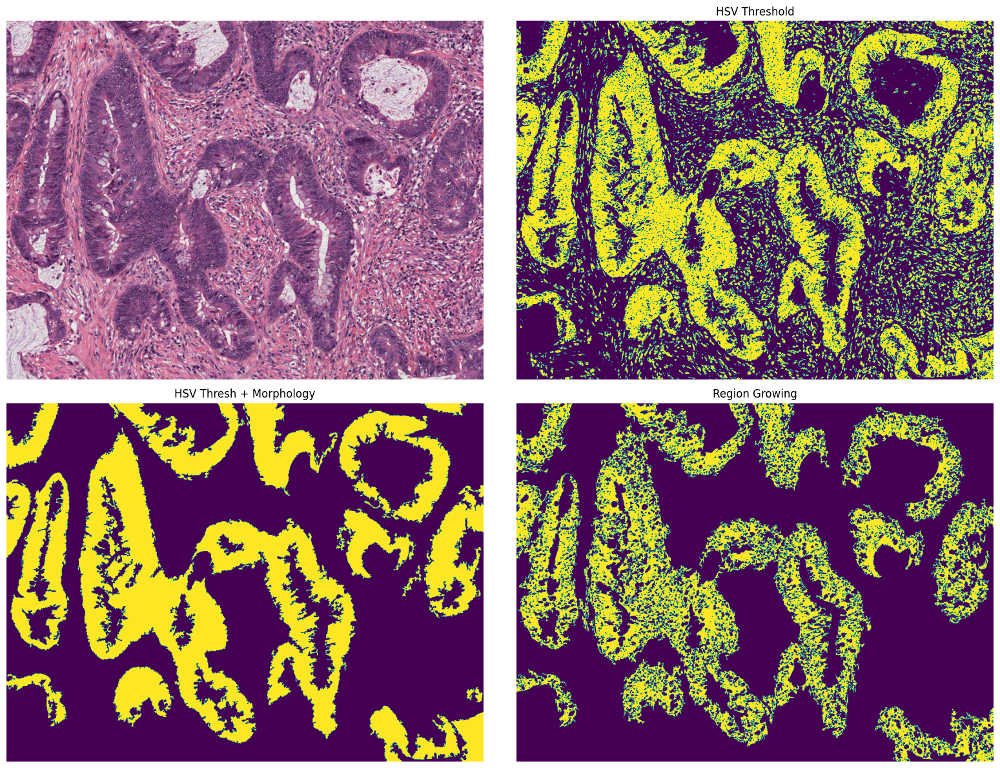

In [55]:
_, axes = plt.subplots(2, 2, figsize=(16, 12))

# Remove axis
axes = axes.ravel()
[a.axis('off') for a in axes]

# Original image
axes[0].imshow(img_he)
# Detections
axes[1].imshow(apply_hsv_threshold(img_he))
axes[1].set_title("HSV Threshold")
axes[2].imshow(apply_morphology(apply_hsv_threshold(img_he)))
axes[2].set_title("HSV Thresh + Morphology")
axes[3].imshow(region_growing(seeds=seeds, img=img_he, n_max=1000))
axes[3].set_title("Region Growing")
plt.tight_layout()

---
# Part 2 - Sandbox [6 pts]

For the second part, you will work on a new HE case without help. This time we ask you to
* **Q1 (3 pts)**: detect and compute the area of the blood cells,
* **Q2 (3 pts)**: detect and compute the area of the mucin.

Provide your results to the function `plot_results`. See the example below. Be careful, the completely white area is not mucin. It is the slide background and should be discarded. Moreover, you can focus on the large blood cell aggregates (large red areas)

Image shape: 1344x1870x3


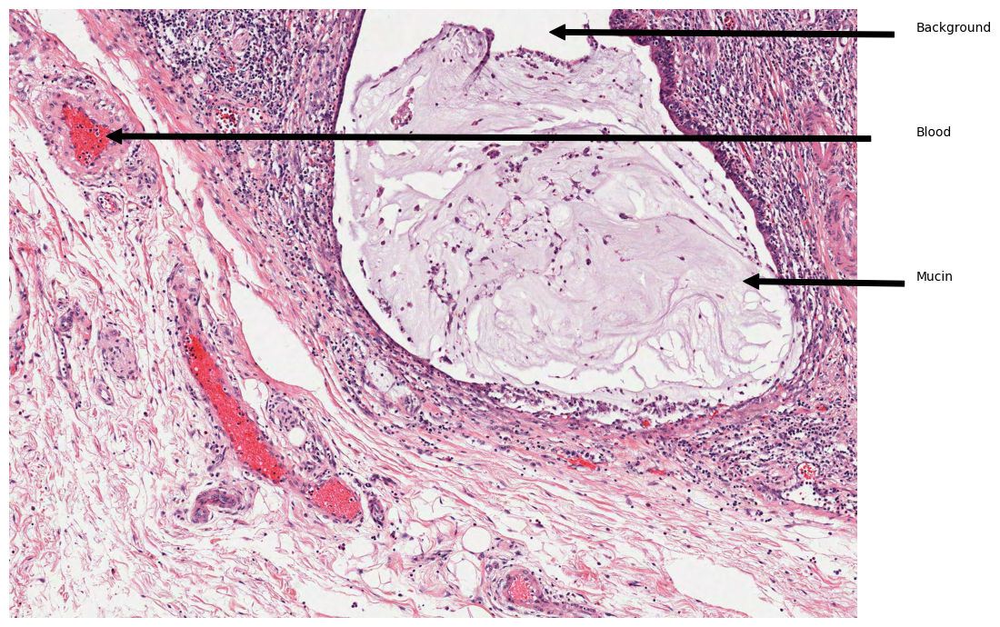

In [56]:
# Load image
path_he2 = os.path.join("..", "data", "data_lab_01", "tcga_blood_example.png")
# Check if folder and image exist
assert os.path.exists(path_he2), "Image not found, please check directory structure"
img_he2 = np.array(Image.open(path_he2))

# Display image
plt.figure(figsize=(14, 7))
plt.imshow(img_he2)
plt.axis('off')
plt.tight_layout()

M,N,C =  np.shape(img_he2)
print(f"Image shape: {M}x{N}x{C}")

# Annotations
plt.annotate('Background', xy=(1150, 50), xytext=(2000, 50), arrowprops=dict(facecolor='black', shrink=0.05))
plt.annotate('Blood', xy=(120, 280), xytext=(2000, 280), arrowprops=dict(facecolor='black', shrink=0.05))
plt.annotate('Mucin', xy=(1600, 600), xytext=(2000, 600), arrowprops=dict(facecolor='black', shrink=0.05))
plt.tight_layout()

In [60]:
# We define hyperparamters 
value_threshold_high = 230
value_threshold_low = 185
var_threshold = 230

In [76]:
def define_hsv_range(h, s, v):
    lower = np.array([h-8, max(0, s-35), max(0, v-35)])
    upper = np.array([h+8, min(255, s+35), min(255, v+35)])
    return lower, upper


In [77]:
def initialize_region_growing(M, N):
    return np.zeros((M, N)).astype(bool), np.zeros((M, N)).astype(bool)

def region_growing(img, to_grow, mucin_rg, value_threshold_high, value_threshold_low, var_threshold):
    M, N = img.shape
    while(np.any(to_grow)):
        for iteration in range(100): # We check every 100 iterations if the detected mucin region has changed.
            # Get the coordinaes of the pixels to grow
            pixels_to_grow_coords = np.transpose(np.where(to_grow == True))
            mucin_rg_previous = mucin_rg.copy()
            # Check pixel's neighbors
            for pixel in pixels_to_grow_coords:
                for dx, dy in [(-1, 0), (1, 0), (0, -1), (0, 1), (-1, -1), (-1, 1), (1, -1), (1, 1)]:
                    x, y = pixel[0] + dx, pixel[1] + dy
                    # Check if coordinates are valid and pixel is not yet in the region
                    if x >= 0 and x < M and y >= 0 and y < N and not mucin_rg[x, y]:
                        # Calculate local variance around the pixel
                        local_var = 10
                        # Check if local variance and intensity difference are below their respective thresholds
                        if local_var <= var_threshold and img[x, y] <= value_threshold_high and img[x, y] >= value_threshold_low:
                            # Add pixel to region
                            mucin_rg[x, y] = True
                            # Add pixel as a pixel to grow next iteration
                            to_grow[x, y] = True
                    # Remove the pixel from the list of pixels to grow
                to_grow[pixel[0], pixel[1]] = False
    return mucin_rg

In [78]:
def apply_morphological_operators(mask):
    disk_size_opening = 6
    disk_size_closing = 5
    size = 350

    # Apply closing
    mask = apply_closing(mask, disk_size_closing)

    # Remove small objects
    mask = remove_objects(mask, size)

    # Apply opening
    mask = apply_opening(mask, disk_size_opening)

    return mask

In [79]:
def compute_area(mask):
    return np.sum(mask) / 255

def print_areas(area_blood, area_mucin):
    print(f"Area of blood cells: {area_blood}\nArea of mucin: {area_mucin}")

In [80]:
M, N, C = np.shape(img_he2)
mask_blood = np.zeros((M, N))
mask_mucin = np.zeros((M, N))

# Convert blood image to HSV
img_hsv = cv2.cvtColor(img_he2, cv2.COLOR_RGB2HSV)

# Convert mucin inage to grayscale
img_gray_mucin = cv2.cvtColor(img_he2, cv2.COLOR_RGB2GRAY)


### Blood detection

In [81]:
# Get HSV value of a pixel that represents blood
h_blood, s_blood, v_blood = img_hsv[970, 530] # We manually select the seed for blood

# Define a small range around the blood HSV value
lower_blood, upper_blood = define_hsv_range(h_blood, s_blood, v_blood)

# Apply color thresholding to detect blood 
# This returns a binary mask where the blood cells are represented 
# by 255 and everything else by 0
mask_blood = cv2.inRange(img_hsv, lower_blood, upper_blood)

# Apply morphology to mask to get rid of small objects and holes
mask_blood = apply_morphological_operators(mask_blood)

### Mucin detection

In [82]:
# Now we will detect mucin with a region growing method
mucin_rg, mucin_rg_previous = initialize_region_growing(M, N)

# We create a list of pixels to grow next iteration
to_grow_mucin = np.zeros((M, N)).astype(bool)

# We manually select the seed for mucin    
mucin_seed = [(590, 1250)]
for seed in mucin_seed:
    mucin_rg[seed] = True

to_grow_mucin[:] = mucin_rg
mucin_rg = region_growing(img_gray_mucin, to_grow_mucin, mucin_rg, 230, 185, 230)

mask_mucin[:] = mucin_rg.astype(np.uint8)

In [83]:
# Note that the area of the blood cells and mucin are computed in pixels.
print_areas(compute_area(mask_blood), compute_area(mask_mucin))

Area of blood cells: 34447.0
Area of mucin: 1526.7686274509804


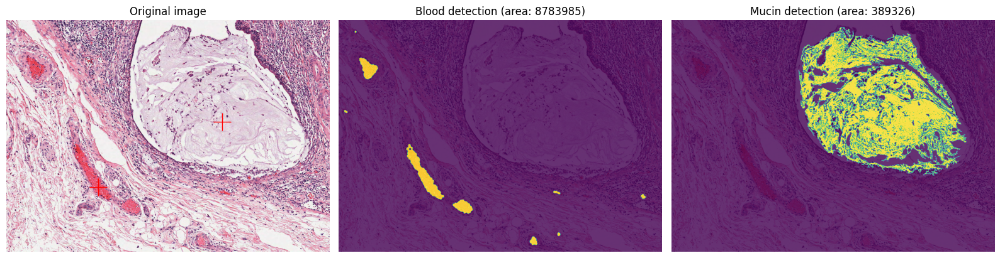

In [84]:
def plot_results(
    img: np.ndarray,
    mask_blood: np.ndarray,
    mask_mucin: np.ndarray,
):
    """
    Plot the blood and mucin detection as well as the estimated area in pixels
    
    Args
    ----
    img: np.ndarray (M, N, C)
        Reference RGB input image
    mask_blood: np.ndarray (M, N)
        Estimation mask of the blood aggregates
    mask_mucin: np.ndarray (M, N)
        Estimation mask of the mucin area
    """
    
    _, axes = plt.subplots(1, 3, figsize=(16, 6))
    [a.axis("off") for a in axes]

    area_blood = np.sum(mask_blood)
    area_mucin = np.sum(mask_mucin)
    
    # Image
    axes[0].imshow(img)
    axes[0].set_title("Original image")
    axes[0].plot(530, 970, 'r+', markersize=20)  # add a red cross
    axes[0].plot(1250, 590, 'r+', markersize=20)  # add a red cross
    # Mask blood
    axes[1].imshow(img)
    axes[1].imshow(mask_blood, alpha=0.8)
    axes[1].set_title("Blood detection (area: {:.0f})".format(area_blood))
    # Mask mucin
    axes[2].imshow(img)
    axes[2].imshow(mask_mucin, alpha=0.8)
    axes[2].set_title("Mucin detection (area: {:.0f})".format(area_mucin))
    plt.tight_layout()

plot_results(img=img_he2, mask_blood=mask_blood, mask_mucin=mask_mucin)